In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import json
import os
import sys

sc.settings.set_figure_params(dpi=80)
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

In [2]:
sys.path.append(os.path.abspath('../'))

In [3]:
from utils import tresholds, layer_palette, apply_percentile_treshold, apply_upper_treshold

### Global environment

In [4]:
qc_palette = sns.color_palette(['red', 'gray'])

In [5]:
# Define paths and get sample_ids
file_list = os.listdir('../../data/raw_spatial_data/macaque/')
file_list

['macaque_0701', 'macaque_0703', 'macaque_0704', 'macaque_nb0904']

In [6]:
file = 'macaque_0701'

# Load the data

In [8]:
# layer annotation
ann = pd.read_csv('../../data/clusters/M_0701_relabeled.csv', index_col=0)
ann.columns = ['label']
ann.head()

,label
Barcode,
AAACAAGTATCTCCCA-1,L2
AAACACCAATAACTGC-1,L6a
AAACAGCTTTCAGAAG-1,L5
AAACAGGGTCTATATT-1,L6a
AAACATTTCCCGGATT-1,L1


In [9]:
# expression
adata = sc.read_visium('../../data/raw_spatial_data/macaque/'+ file)
adata.var_names_make_unique()
adata.obs['label'] = ann.label
adata.obs['sample_id'] = file

reading ..\..\data\raw_spatial_data\macaque\macaque_0701\filtered_feature_bc_matrix.h5
 (0:00:00)


c:\projects\spatialMPFC\venv\Lib\site-packages\anndata\_core\anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
c:\projects\spatialMPFC\venv\Lib\site-packages\anndata\_core\anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Проверим все ли споты имеют аннотацию

In [10]:
adata.obs.label.notna().value_counts()

label
True    2963
Name: count, dtype: int64

In [11]:
adata.obs.label.value_counts()

label
L3             815
L4             541
L5             507
L1             292
L6a            247
L2             236
Empty spots    206
WM              83
L6b             36
Name: count, dtype: int64

# Adata

## Metrics

In [12]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['hb'] = adata.var_names.str.contains(("^HB[AB]"))
adata.var['ribo'] = adata.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=['mt','hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

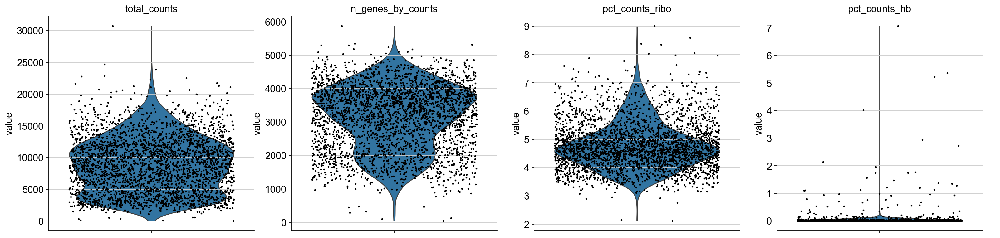

In [13]:
sc.pl.violin(adata,
             keys = ['total_counts', 'n_genes_by_counts','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, rotation= 45, multi_panel=True, size=2.5)

Lets look at separate layers

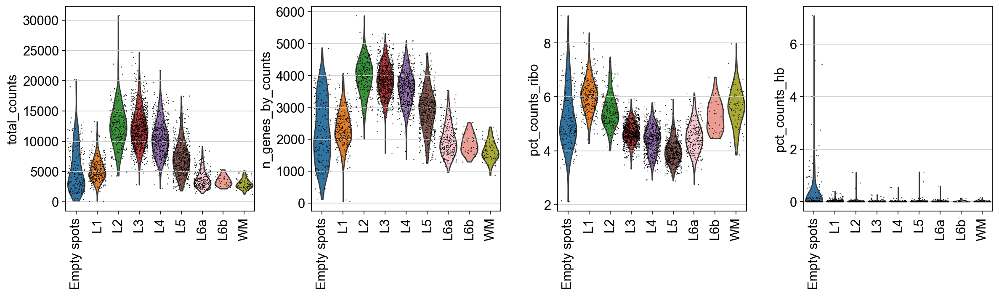

In [14]:
sc.pl.violin(adata,
             keys = ['total_counts', 'n_genes_by_counts','pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'label', rotation= 90, palette=layer_palette)

Lets look at spatial distribution

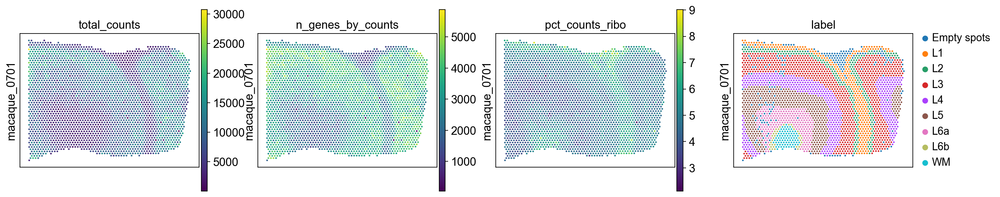

In [15]:
sq.pl.spatial_scatter(adata,
                      color = ['total_counts', 'n_genes_by_counts','pct_counts_ribo', 'label'],
                      ncols=4, img=False, axis_label=['', file])

### Libriary size

Lets look at histogram

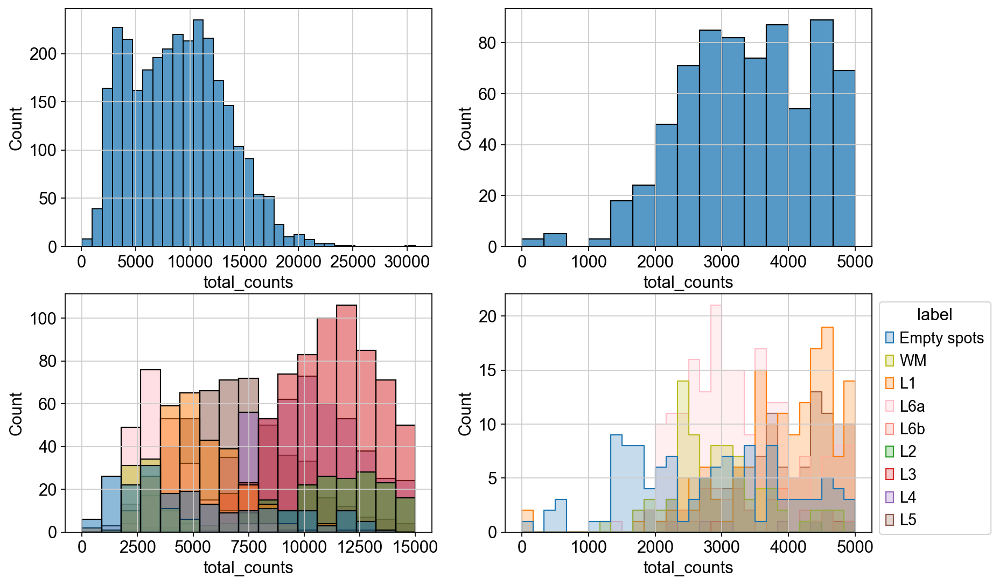

In [16]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6a', 'L6b', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='total_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 15000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='total_counts', binrange=[0, 5000], ax=axs[0][1])
sns.histplot(adata.obs, x='total_counts', binrange=[0, 5000], bins=30, hue='label',fill=True, element="step", hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Calculate thresholds for each layer

In [17]:
apply_percentile_treshold(adata, 'total_counts')

Всего образцов не прошедших трешхолд: 70


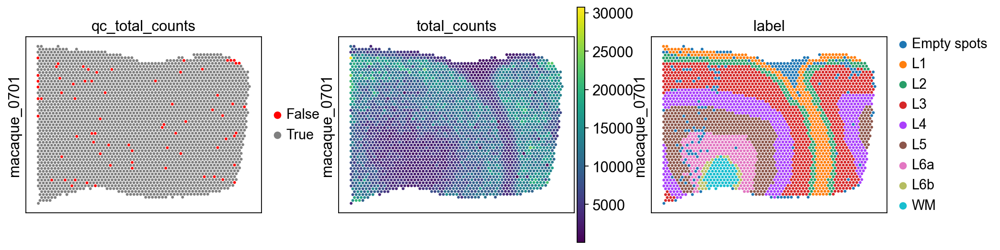

In [18]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_total_counts', 'total_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Number of expressed features

Lets look at histogram

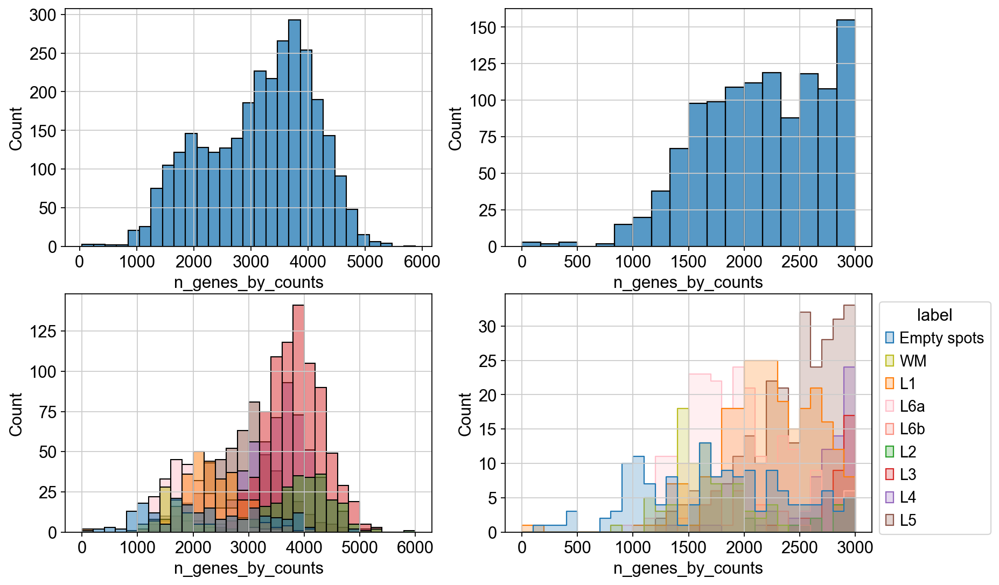

In [19]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6a', 'L6b', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='n_genes_by_counts', ax=axs[0][0])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 6000], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 3000], ax=axs[0][1])
sns.histplot(adata.obs, x='n_genes_by_counts', binrange=[0, 3000], bins=30, hue='label',fill=True, element="step", hue_order=hue_order, ax=axs[1][1], palette=layer_palette)
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

Calculate thresholds for each layer

In [20]:
apply_percentile_treshold(adata, 'n_genes_by_counts', right_bound=False)

Всего образцов не прошедших трешхолд: 67


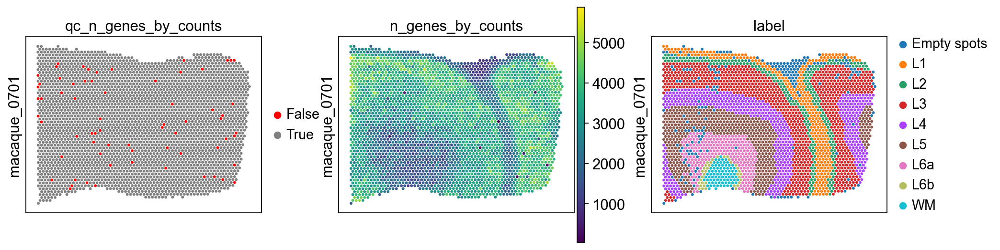

In [21]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_n_genes_by_counts', 'n_genes_by_counts', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of ribosomal reads

In [22]:
apply_upper_treshold(adata, 'pct_counts_ribo')

Трешхолд равняется : 22
Всего образцов не прошедших трешхолд: 0


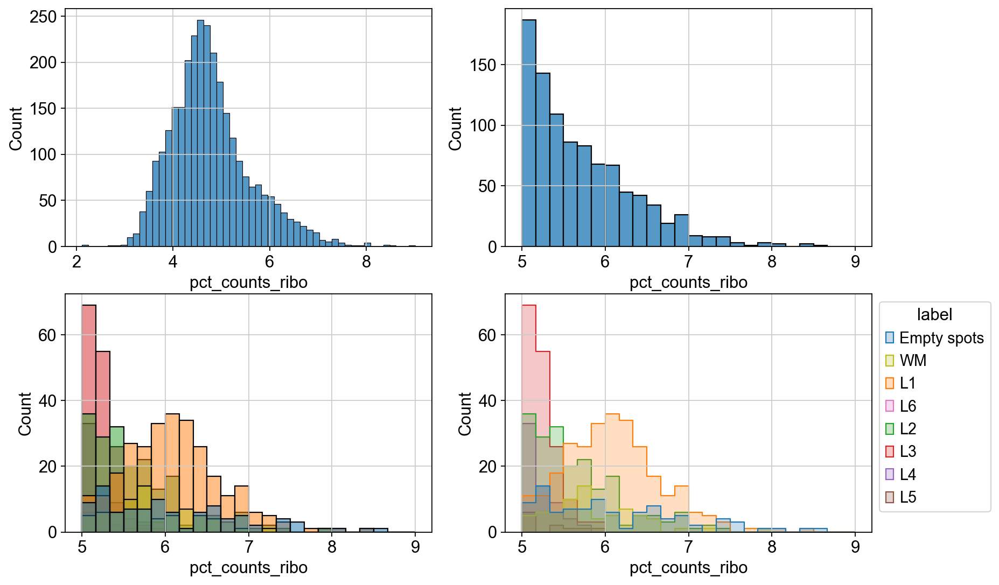

In [39]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8), gridspec_kw={'wspace': 0.2, 'hspace': 0.2})
hue_order = ['Empty spots', 'WM', 'L1', 'L6', 'L2', 'L3', 'L4', 'L5']

sns.histplot(adata.obs, x='pct_counts_ribo', ax=axs[0][0])
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[5, 9], hue='label', hue_order=hue_order, ax=axs[1][0], legend=False, palette=layer_palette)
#sns.move_legend(axs[1][0], "upper left", bbox_to_anchor=(1, 1))
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[5, 9], ax=axs[0][1])
sns.histplot(adata.obs, x='pct_counts_ribo', binrange=[5, 9], hue='label', hue_order=hue_order, ax=axs[1][1], palette=layer_palette, fill=True, element="step")
sns.move_legend(axs[1][1], "upper left", bbox_to_anchor=(1, 1))

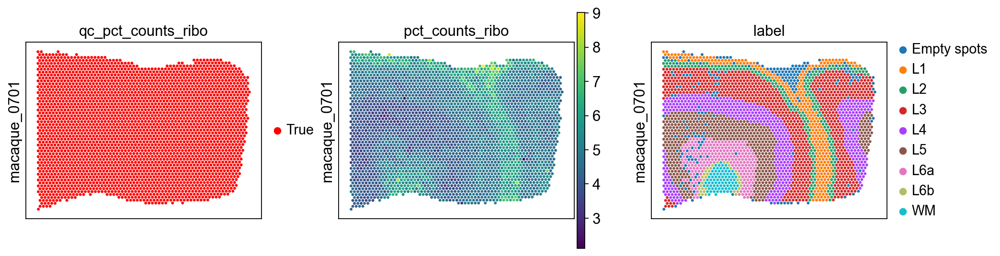

In [24]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_pct_counts_ribo', 'pct_counts_ribo', 'label'], img=False, axis_label=['', file], size=1.3)

### Proportion of hemoglobin reads

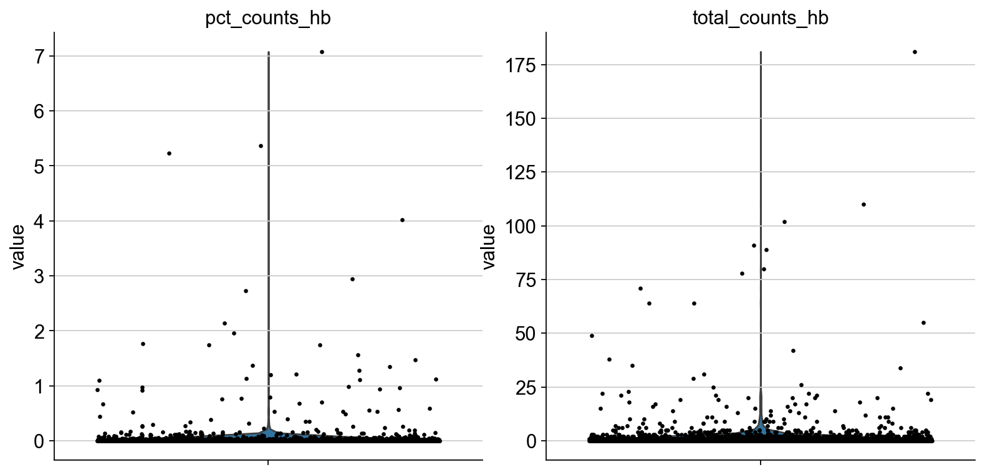

In [25]:
sc.pl.violin(adata,
             keys = ['pct_counts_hb', 'total_counts_hb'], jitter=0.4, size=3, multi_panel=True)

In [26]:
apply_upper_treshold(adata, 'pct_counts_hb')

Трешхолд равняется : 2
Всего образцов не прошедших трешхолд: 7
label
Empty spots    7
Name: count, dtype: int64


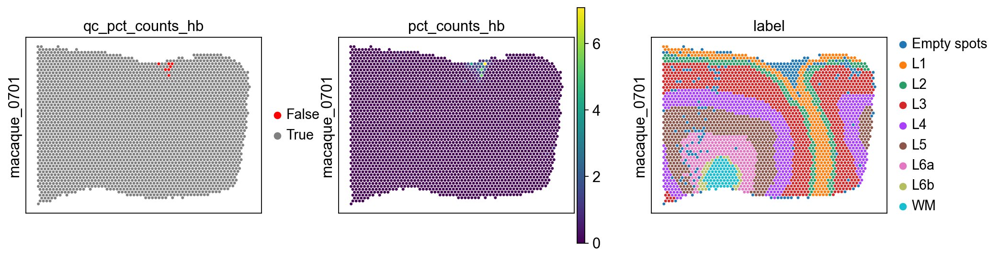

In [27]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_pct_counts_hb', 'pct_counts_hb', 'label'], img=False, axis_label=['', file], size=1.3)

## Combined

### QC spatial_scatter

In [28]:
adata.obs['qc_total_counts'].astype(bool).value_counts()

qc_total_counts
True    2963
Name: count, dtype: int64

In [29]:
d = {'True': True, 'False': False}
adata.obs['qc_total_counts'].replace(d, inplace=True)
adata.obs['qc_n_genes_by_counts'].replace(d, inplace=True)
adata.obs['qc_pct_counts_ribo'].replace(d, inplace=True)
adata.obs['qc_pct_counts_hb'].replace(d, inplace=True)

In [30]:
adata.obs['qc_good_spots'] = (adata.obs.qc_total_counts.astype(bool) * adata.obs.qc_n_genes_by_counts.astype(bool) *
                              adata.obs.qc_pct_counts_ribo.astype(bool) * adata.obs.qc_pct_counts_hb.astype(bool)).astype('string')
vc = adata.obs.groupby('qc_good_spots')['label'].value_counts()
print(f"Число образцов не прошедших порог N={adata.obs['qc_good_spots'].value_counts()['False']}\n")
print(vc[vc > 0]['False'])

Число образцов не прошедших порог N=82

label
L3             19
L5             14
Empty spots    13
L4             13
L6a             7
L1              6
L2              6
L6b             2
WM              2
Name: count, dtype: int64


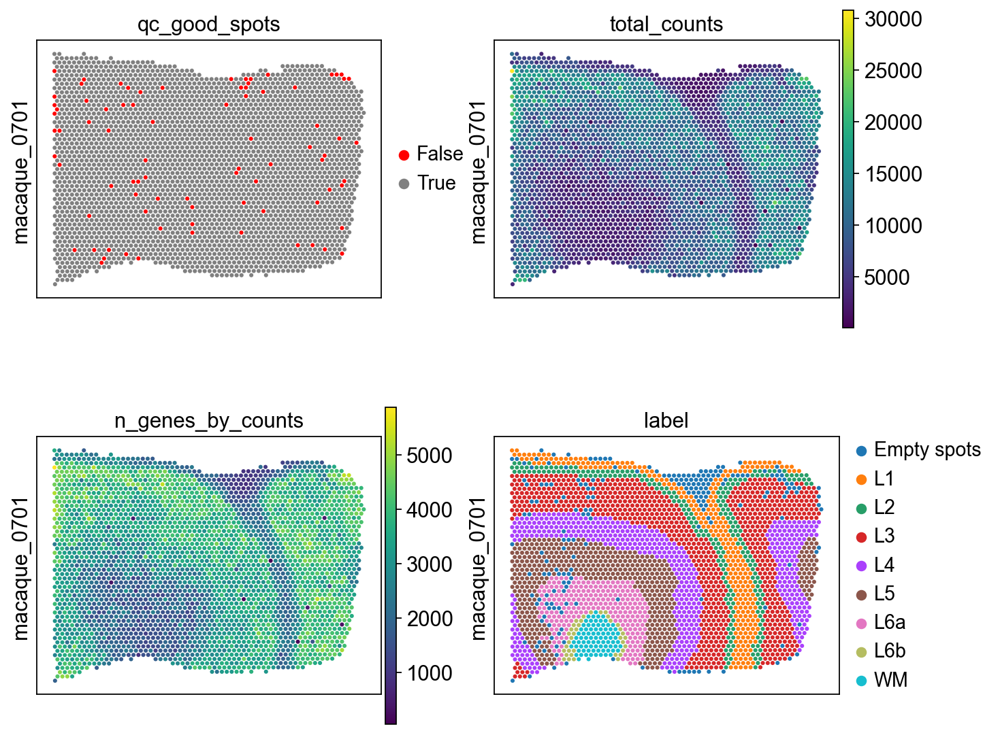

In [31]:
with qc_palette:
    sq.pl.spatial_scatter(adata, color=['qc_good_spots',  'total_counts', 'n_genes_by_counts', 'label'],
                          img=False, axis_label=['', file], size=1.3, ncols=2)

### QC scatter plots

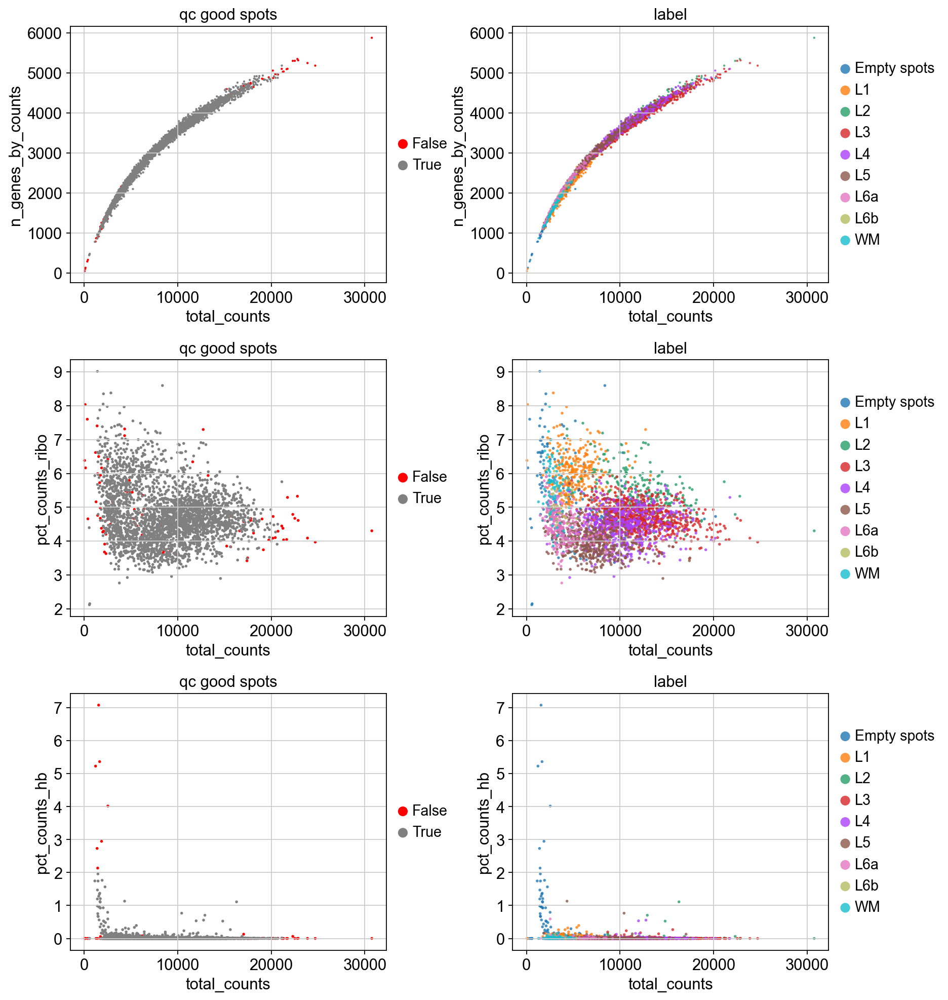

In [32]:
fig, ax = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'wspace': 0.4, 'hspace': 0.3})
alpha = 0.8


sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="qc_good_spots", ax=ax[0][0], show=False, size=15)
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="label", ax=ax[0][1], show=False, alpha=alpha, size=15)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="qc_good_spots", ax=ax[1][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_ribo', color="label", ax=ax[1][1], show=False, alpha=alpha, size=25)

sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="qc_good_spots", ax=ax[2][0], show=False, size=25)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_hb', color="label", ax=ax[2][1], show=False, alpha=alpha, size=25)

plt.show()

### Save filtered spots

In [33]:
good_spots = adata.obs[(adata.obs.qc_good_spots == 'True') &
                           (adata.obs.label != 'Empty spots') &
                           (adata.obs.label.notna())].index

In [34]:
adata_filtered = adata[good_spots].copy()

### PCA

In [35]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.tl.pca(adata)

normalizing counts per cell


    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:21)


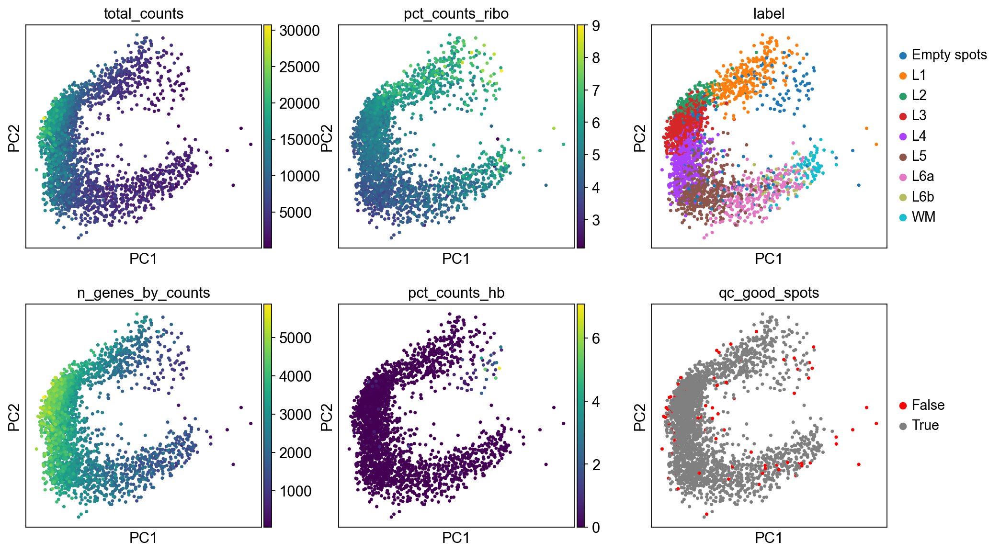

In [36]:
sc.pl.pca(adata, 
          color=['total_counts','pct_counts_ribo', 'label', 'n_genes_by_counts',  'pct_counts_hb', 'qc_good_spots'],
          ncols=3, show=True)

## Save to .h5ad

In [37]:
adata_filtered.obs.drop(['qc_total_counts','qc_n_genes_by_counts', 'qc_good_spots',
                         'qc_pct_counts_hb', 'qc_pct_counts_ribo'], axis=1, inplace=True)

In [40]:
os.makedirs('results/filtered_samples', exist_ok=True)
os.makedirs('results/filtered_samples/macaque', exist_ok=True)
adata_filtered.write_h5ad(f'results/filtered_samples/macaque/{file}.h5ad')